In [ ]:
import torch
from torch.utils.data import DataLoader

from src.utils_data import load_PeMS04_flow_data, preprocess_PeMS_data, createLoaders, TimeSeriesDataset
from src.utils_graph import compute_laplacian_with_self_loop
from src.models import TGCN, GRUModel, LSTMModel, train_model

import pandas as pd

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Preprocessing data

In [ ]:
df_PeMS, df_distance  = load_PeMS04_flow_data()
n_neighbors = 16
normalization = "center_and_reduce"
df_PeMS, adjacency_matrix_PeMS, meanstd_dict = preprocess_PeMS_data(df_PeMS, df_distance, init_node=0, n_neighbors=n_neighbors, center_and_reduce=True)

In [ ]:
print(df_PeMS.columns)

In [ ]:
# Define the sliding window size and stride
_window_size = 7
_stride = 1

## TGCN

In [ ]:
train_loader_TGCN, val_loader_TGCN, test_loader_TGCN = createLoaders(df_PeMS, window_size=_window_size, stride=_stride)
model_TGCN = TGCN(adjacency_matrix_PeMS, hidden_dim=32, output_size=len(df_PeMS.columns))

In [ ]:
import matplotlib.pyplot as plt

num_epochs_TGCN = 150
model_path = f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_TGCN}/TGCN_model.pkl"
_ , valid_losses, train_losses = train_model(model_TGCN, train_loader_TGCN, val_loader_TGCN, model_path=model_path, num_epochs=num_epochs_TGCN, remove=False)
plt.figure(figsize=(25, 9))
plt.title("TCGN")
plt.plot(train_losses, label="train_losses")
plt.legend(fontsize=12)
plt.show()
plt.figure(figsize=(25, 9))
plt.title("TCGN")
plt.plot(valid_losses, label="valid_losses")
plt.legend(fontsize=12)
plt.show()

## Univariate 

### LSTM

In [ ]:
models_univaritate_LSTM = {}

for i in range(n_neighbors+1):
    #print(f"LSTMModel {i}")
    train_loader, val_loader, test_loader = createLoaders(pd.DataFrame(df_PeMS.iloc[:, i]), window_size=_window_size, stride=_stride)
    models_univaritate_LSTM[f"LSTMModel {i}"] = {
                                                "model": LSTMModel(1, 32, 1),
                                                "train_loader": train_loader,
                                                "val_loader": val_loader,
                                                "test_loader": test_loader
    }

In [ ]:
num_epochs_LSTM_univariate = 150

for i in range(n_neighbors+1):
    _, valid_losses, train_losses = train_model(models_univaritate_LSTM[f"LSTMModel {i}"]["model"], 
                models_univaritate_LSTM[f"LSTMModel {i}"]["train_loader"], 
                models_univaritate_LSTM[f"LSTMModel {i}"]["val_loader"], 
                f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_LSTM_univariate}/univariate_LSTM_model_{i}.pkl", num_epochs=num_epochs_LSTM_univariate, remove=False)
    plt.figure(figsize=(25, 9))
    plt.title(f"LSTM captor {i} TRAIN LOSSES")
    plt.plot(train_losses, label="train_losses")
    plt.legend(fontsize=12)
    plt.show()
    plt.figure(figsize=(25, 9))
    plt.title(f"LSTM captor{i} VALID LOSSES")
    plt.plot(valid_losses, label="valid_losses")
    plt.legend(fontsize=12)
    plt.show()

### GRU

In [ ]:
models_univaritate_GRU = {}

for i in range(n_neighbors+1):
    #print(f"GRUModel {i}")
    train_loader, val_loader, test_loader = createLoaders(pd.DataFrame(df_PeMS.iloc[:, i]), window_size=_window_size, stride=_stride)
    models_univaritate_GRU[f"GRUModel {i}"] = { 
                                                "model": GRUModel(1, 32, 1),
                                                "train_loader": train_loader,
                                                "val_loader": val_loader,
                                                "test_loader": test_loader
    }

In [ ]:
num_epochs_univaritate_GRU = 150

for i in range(n_neighbors+1):
    _, valid_losses, train_losses = train_model(models_univaritate_GRU[f"GRUModel {i}"]["model"], 
                models_univaritate_GRU[f"GRUModel {i}"]["train_loader"], 
                models_univaritate_GRU[f"GRUModel {i}"]["val_loader"], 
                f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_univaritate_GRU}/univariate_GRU_model_{i}.pkl", num_epochs=num_epochs_univaritate_GRU, remove=False)
    plt.figure(figsize=(25, 9))
    plt.title(f"GRU captor {i} TRAIN LOSSES")
    plt.plot(train_losses, label="train_losses")
    plt.legend(fontsize=12)
    plt.show()
    plt.figure(figsize=(25, 9))
    plt.title(f"GRU captor{i} VALID LOSSES")
    plt.plot(valid_losses, label="valid_losses")
    plt.legend(fontsize=12)
    plt.show()

## Functions for results 

In [15]:
def result_prediction(predictions, actuals):
    from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
    import numpy as np
    
    indices_by_month = []
    EPSILON = 1e-5
    # Créer une liste vide pour stocker les données du tableau
    data = []
    y_pred = predictions[:]
    y_true = actuals[:]

    signe = "-" if np.mean(y_pred - y_true) < 0 else "+"
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = mean_absolute_percentage_error(y_true, y_pred)*100
    if (mape > 1 or mape < 0):
        mape = "ERROR"
    smape = np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))*100
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    
    return [signe, mae, rmse, mape, smape, maape]

In [16]:
def highlight_col(col, min_val):
    if col.name == "SMAPE":
        color = ['green' if val <= min_val else 'red' for val in col]
        return [f'background-color: {c}' for c in color]
    else :
        return ['' for _ in range(len(col))]


In [17]:
def highlight_rows(row, min_val, max_val):
    if row["MAAPE"] == min_val:
        color = "green"
    elif row["MAAPE"] == max_val:
        color = "red"
    else:
        color = ""
    
    return [f'background-color: {color}'] * len(row)

In [18]:
######################################################################
# Divide by max
######################################################################
def test_model(best_model, test_loader):
    import numpy as np
    
    # Load the best model and evaluate on the test set
    best_model.double()
    best_model.eval()
    criterion = torch.nn.MSELoss()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    best_model.to(device)

    # Evaluate the model on the test set
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs = (inputs).to(device)
            targets = (targets).squeeze().to(device)
            outputs = best_model(inputs).squeeze()
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            # Save the predictions and actual values for plotting later
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    # print(f"Test Loss: {test_loss:.4f}")
    
    # Concatenate the predictions and actuals
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    return (predictions, actuals)

## Results Multivariate vs Univariate (TGCN VS LSTM - GRU)

In [19]:
import matplotlib.pyplot as plt

######################################################################
# TGCN
######################################################################
# load best model
model_TGCN.load_state_dict(torch.load(f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_TGCN}/TGCN_model.pkl".format(input)))

# Make predictions
predictions_TGCN, actuals_TGCN = test_model(model_TGCN, test_loader_TGCN)


for i in range(n_neighbors+1):

    # Save result for each captor
    temp = result_prediction(predictions_TGCN[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], 
                            actuals_TGCN[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"])
    temp.append(f"TGCN Model captor {df_PeMS.columns[i]}")
    data = [temp]


######################################################################
# LSTM
######################################################################
    # load best model
    models_univaritate_LSTM[f"LSTMModel {i}"]["model"].load_state_dict(torch.load(f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_LSTM_univariate}/univariate_LSTM_model_{i}.pkl".format(input)))
    
    # Make predictions
    predictions_LSTM, actuals_LSTM = test_model(models_univaritate_LSTM[f"LSTMModel {i}"]["model"], 
                                    models_univaritate_LSTM[f"LSTMModel {i}"]["test_loader"])

    # Save result
    temp = result_prediction(predictions_LSTM * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], 
                            actuals_LSTM * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"])

    temp.append(f"LSTM Model captor {df_PeMS.columns[i]}")
    data.append(temp)


######################################################################
# GRU
######################################################################
    # Load best model
    models_univaritate_GRU[f"GRUModel {i}"]["model"].load_state_dict(torch.load(f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_univaritate_GRU}/univariate_GRU_model_{i}.pkl".format(input)))
    predictions_GRU, actuals_GRU = test_model(models_univaritate_GRU[f"GRUModel {i}"]["model"], 
                                    models_univaritate_GRU[f"GRUModel {i}"]["test_loader"])

    # Make predictions
    temp = result_prediction(predictions_GRU * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"]
                            , actuals_GRU * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"])

    # Save results
    temp.append(f"GRU Model captor {df_PeMS.columns[i]}")
    data.append(temp)


######################################################################
# Dataframe
######################################################################

    df = pd.DataFrame(data, columns=['Signe error', 'MAE', 'RMSE', 'MAPE', 'SMAPE', 'MAAPE', "Captor"])

    # Définir le mois comme index du DataFrame
    df.set_index('Captor', inplace=True)

    pd.set_option('display.max_columns', None)
    pd.set_option('display.max_rows', None)
    pd.set_option('display.width', None)

    min_val = df['MAAPE'].min()
    max_val = df['MAAPE'].max()
    #df = df.style.apply(highlight_col, axis=0, min_val=min_val)
    df = df.style.apply(highlight_rows, axis=1, min_val=min_val, max_val=max_val)
    display(df)


######################################################################
# Plots
######################################################################
    plt.figure(figsize=(21, 10))
    plt.plot(predictions_TGCN[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="orange", label="TGCN pred")
    plt.plot(actuals_LSTM * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="black", label="true value")
    plt.legend(fontsize=15)
    plt.show()
    
    plt.figure(figsize=(21, 10))
    plt.plot(predictions_LSTM * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="magenta", label="LSTM pred")
    plt.plot(actuals_LSTM * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="black", label="true value")
    plt.legend(fontsize=15)
    plt.show()
    
    plt.figure(figsize=(21, 10))
    plt.plot(predictions_GRU * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="red", label="GRU pred" )
    plt.plot(actuals_LSTM * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="black", label="true value")
    plt.legend(fontsize=15)
    plt.show()


NameError: name 'models_univaritate_GRU' is not defined

## Multivariate

### LSTM

In [9]:
print("LSTMModel")
train_loader, val_loader, test_loader = createLoaders(pd.DataFrame(df_PeMS), window_size=_window_size, stride=_stride)
models_multivariate_LSTM = {
                                                "model": LSTMModel(len(df_PeMS.columns), 32, len(df_PeMS.columns)),
                                                "train_loader": train_loader,
                                                "val_loader": val_loader,
                                                "test_loader": test_loader
    }

LSTMModel


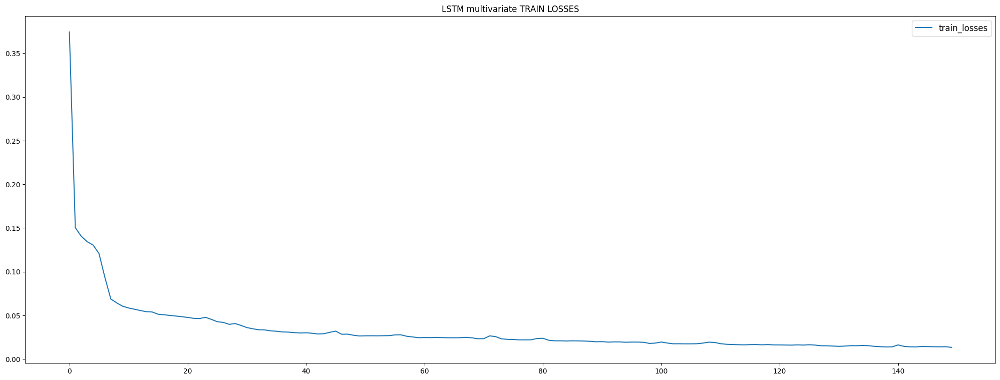

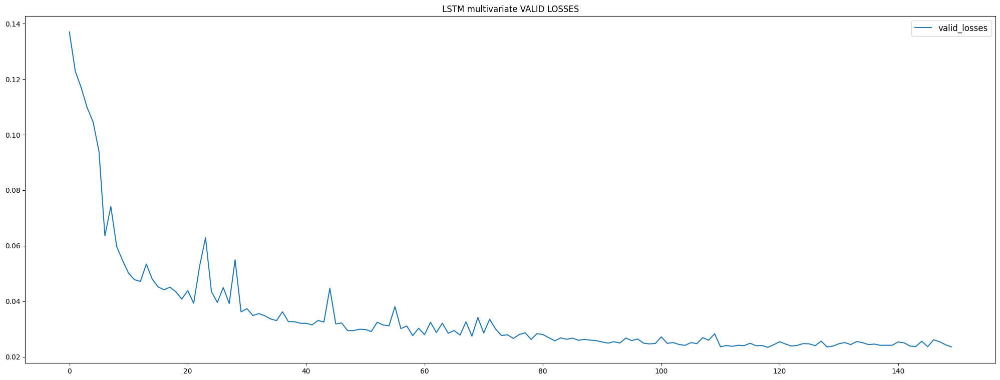

In [10]:
num_epochs_LSTM_multivariate = 150

_, valid_losses, train_losses = train_model(models_multivariate_LSTM["model"], 
            models_multivariate_LSTM["train_loader"], 
            models_multivariate_LSTM["val_loader"], 
            f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_LSTM_multivariate}/multivariate_LSTM_model.pkl", num_epochs=num_epochs_LSTM_multivariate, remove=False)

plt.figure(figsize=(25, 9))
plt.title(f"LSTM multivariate TRAIN LOSSES")
plt.plot(train_losses, label="train_losses")
plt.legend(fontsize=12)
plt.show()
plt.figure(figsize=(25, 9))
plt.title(f"LSTM multivariate VALID LOSSES")
plt.plot(valid_losses, label="valid_losses")
plt.legend(fontsize=12)
plt.show()

### GRU

In [11]:
print("GRUModel")
train_loader, val_loader, test_loader = createLoaders(pd.DataFrame(df_PeMS), window_size=_window_size, stride=_stride)
models_multivariate_GRU = {
                                                "model": GRUModel(len(df_PeMS.columns), 32, len(df_PeMS.columns)),
                                                "train_loader": train_loader,
                                                "val_loader": val_loader,
                                                "test_loader": test_loader
    }

GRUModel


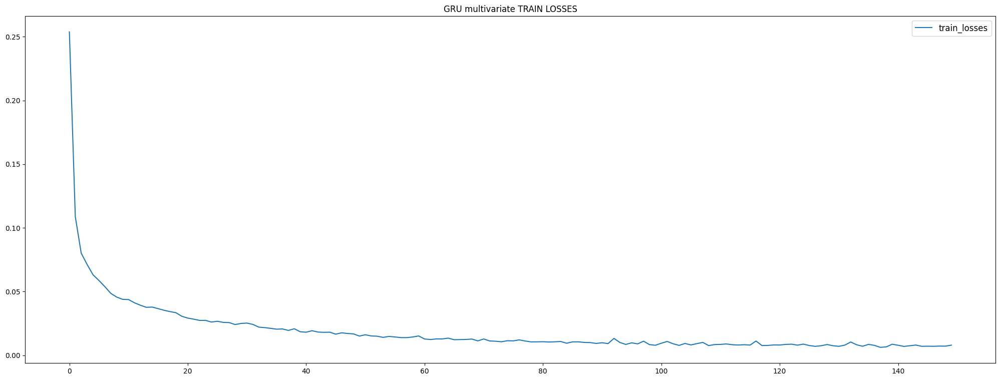

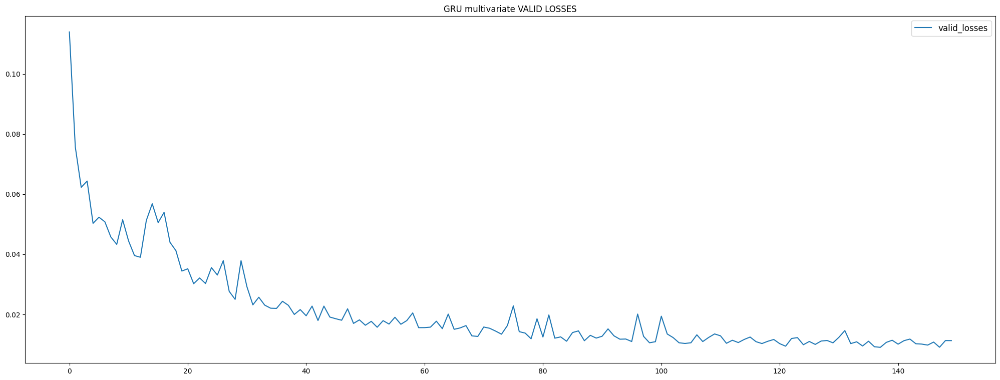

In [12]:
num_epochs_GRU_multivariate = 150

_, valid_losses, train_losses = train_model(models_multivariate_GRU["model"], 
                models_multivariate_GRU["train_loader"], 
                models_multivariate_GRU["val_loader"], 
                f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_GRU_multivariate}/multivariate_GRU_model.pkl", num_epochs=num_epochs_GRU_multivariate, remove=False)
plt.figure(figsize=(25, 9))
plt.title(f"GRU multivariate TRAIN LOSSES")
plt.plot(train_losses, label="train_losses")
plt.legend(fontsize=12)
plt.show()
plt.figure(figsize=(25, 9))
plt.title(f"GRU multivariate VALID LOSSES")
plt.plot(valid_losses, label="valid_losses")
plt.legend(fontsize=12)
plt.show()

## Results Multivariate vs Multivariate (TGCN VS LSTM - GRU)

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 68,+,4.846171,7.190875,ERROR,4.734281,4.833938
LSTM Model captor 68,-,4.934122,7.288916,ERROR,4.944921,4.949916
GRU Model captor 68,-,3.524208,4.861705,ERROR,3.630497,3.612378


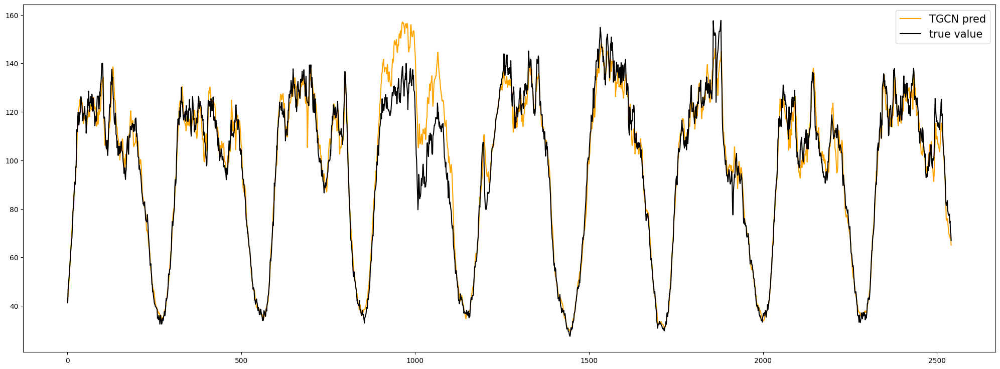

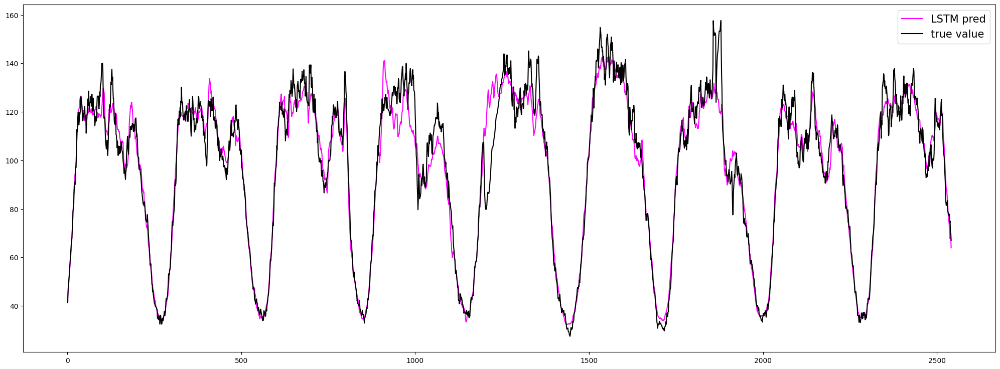

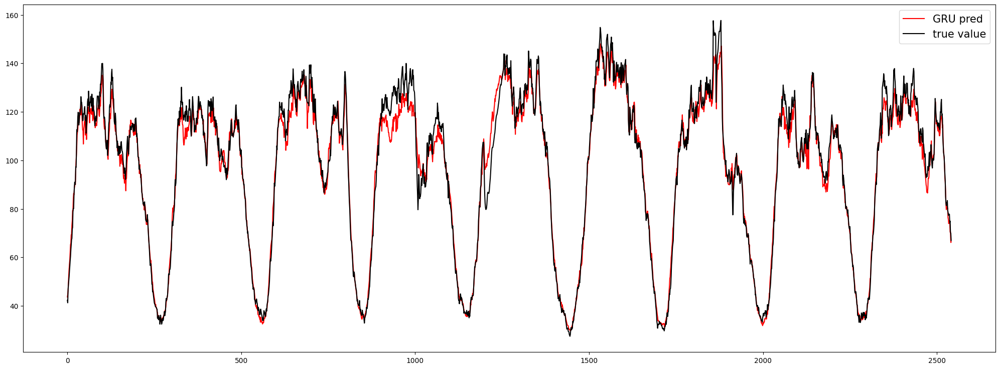

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 62,-,4.729205,6.369228,ERROR,4.518204,4.538669
LSTM Model captor 62,-,7.591640,11.711201,ERROR,6.501153,6.377592
GRU Model captor 62,+,5.768449,7.778207,ERROR,6.033271,5.992154


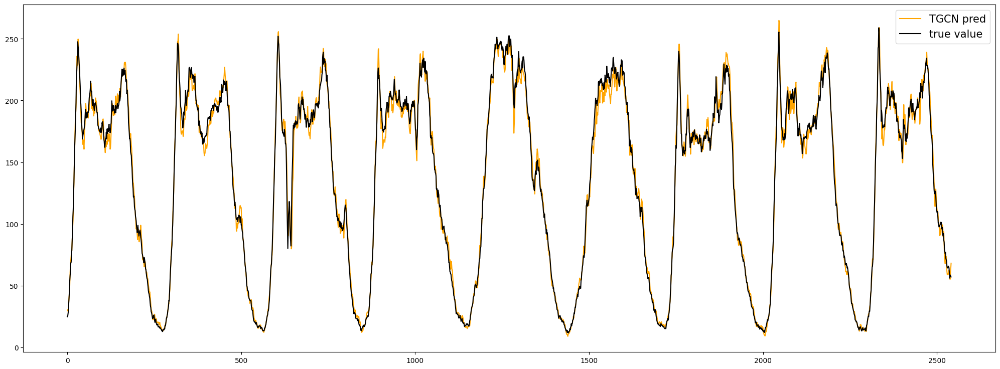

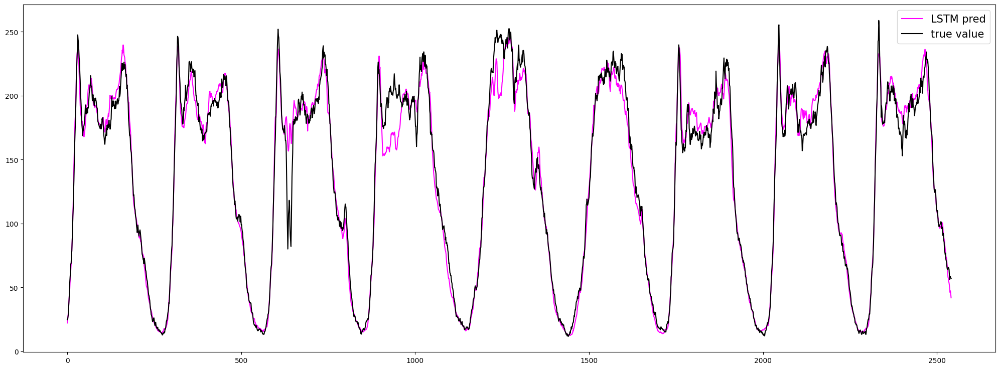

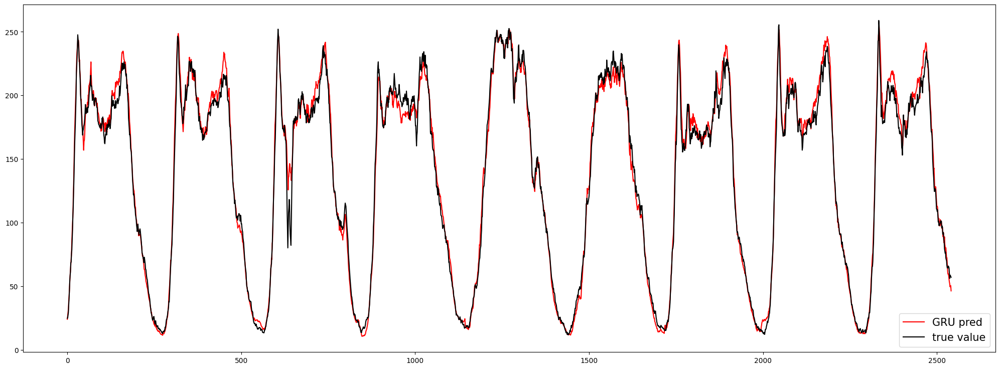

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 104,-,7.028570,9.378243,ERROR,9.287949,8.407015
LSTM Model captor 104,-,8.404916,11.459888,ERROR,8.344805,8.488781
GRU Model captor 104,-,5.618774,7.724377,ERROR,6.042944,6.176774


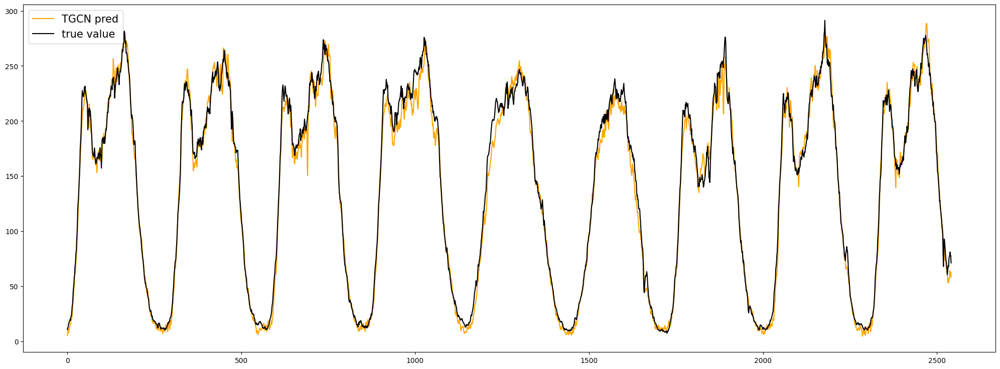

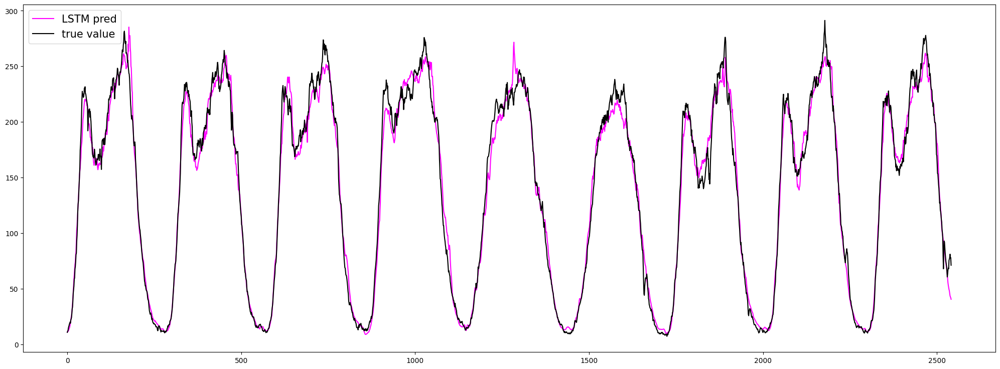

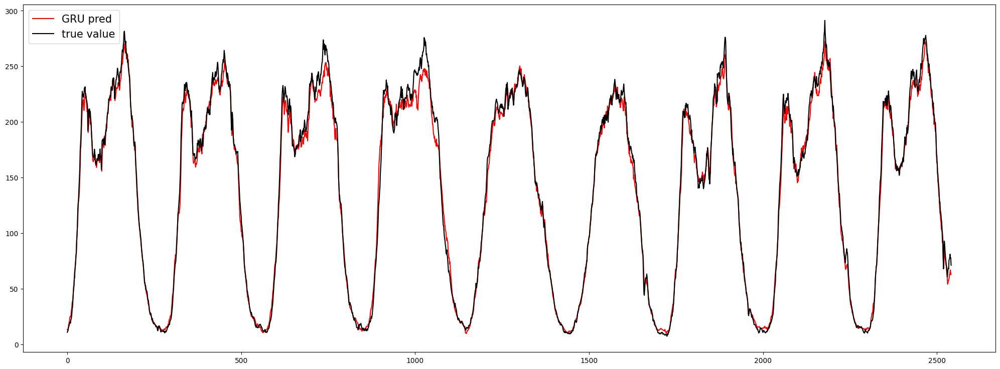

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 242,-,8.835927,11.649398,ERROR,29.449581,25.623660
LSTM Model captor 242,-,7.909422,11.112112,ERROR,25.461298,20.657949
GRU Model captor 242,-,6.647935,8.932803,ERROR,22.107926,21.500704


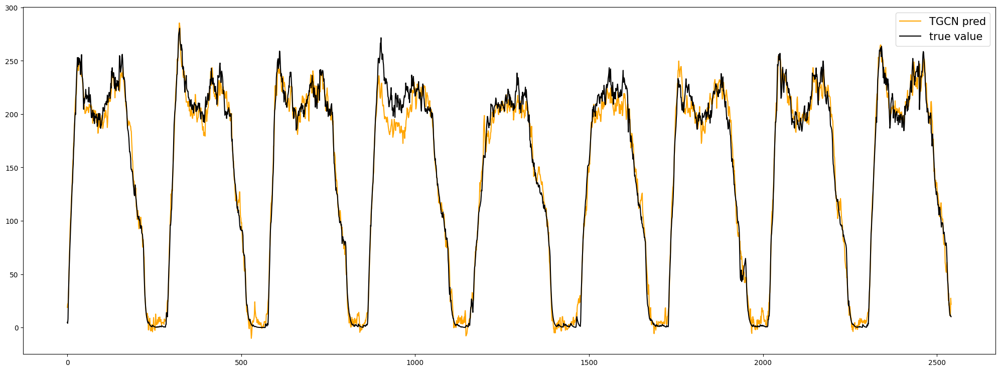

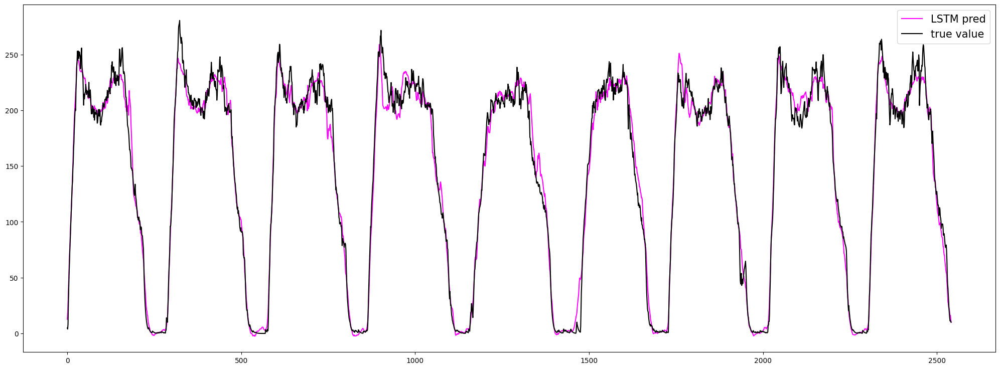

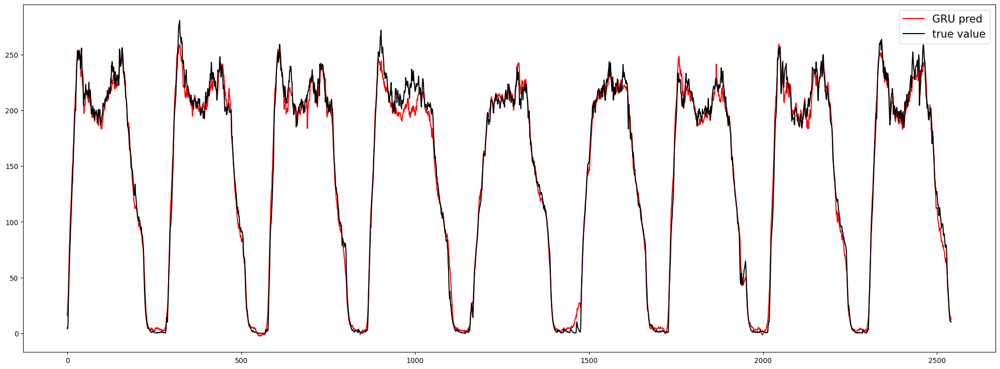

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 243,-,7.700535,10.432606,ERROR,5.444588,5.291755
LSTM Model captor 243,-,7.938130,11.729758,ERROR,5.383008,5.422912
GRU Model captor 243,-,5.626483,8.004951,ERROR,4.130334,4.145332


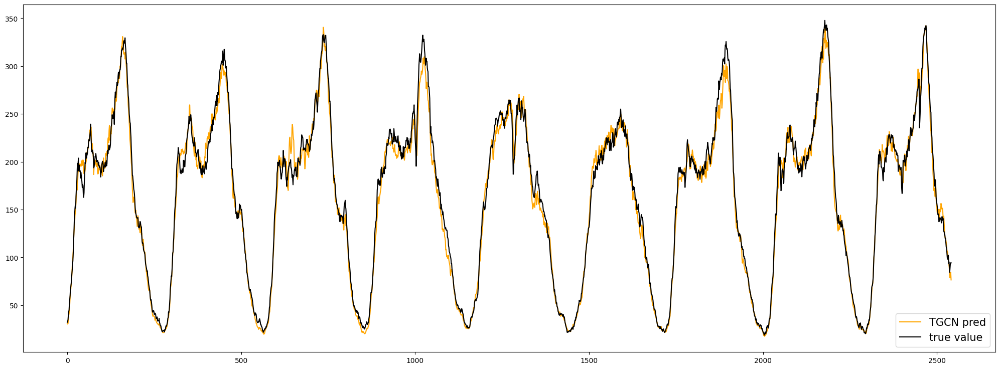

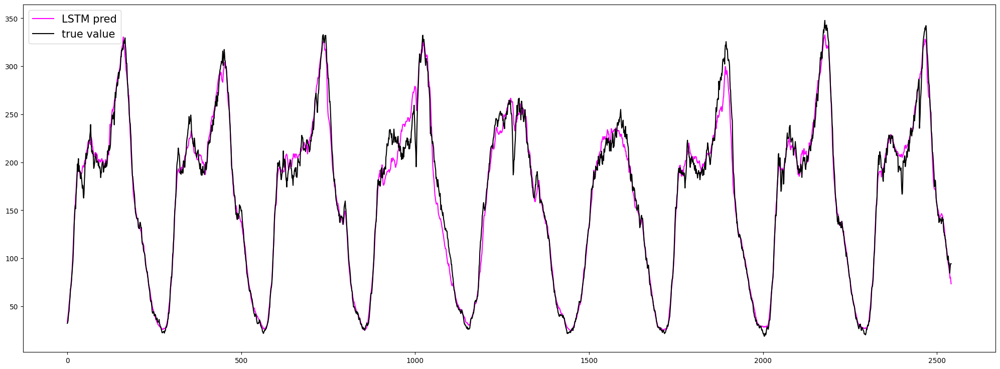

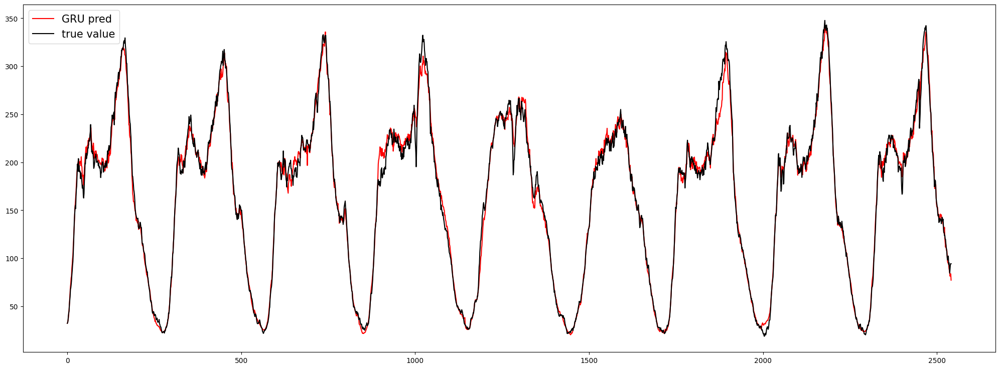

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 117,+,10.530953,14.914295,ERROR,4.530127,4.579484
LSTM Model captor 117,+,16.776497,24.757713,ERROR,7.580544,7.751177
GRU Model captor 117,-,14.566251,24.202700,ERROR,6.389763,6.283082


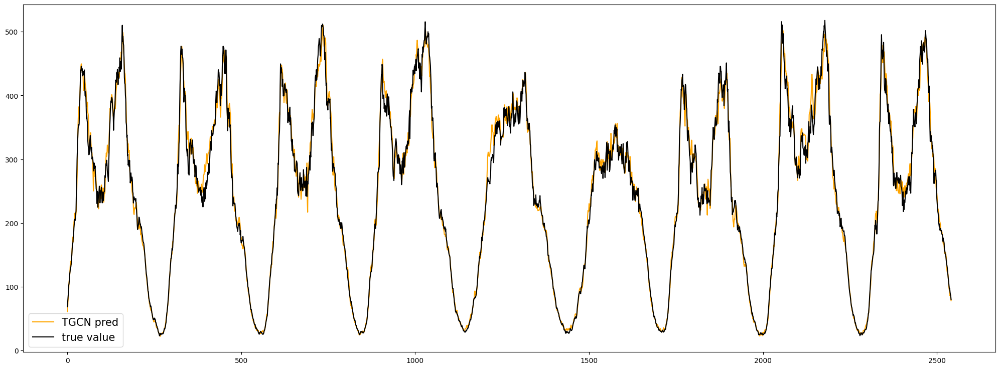

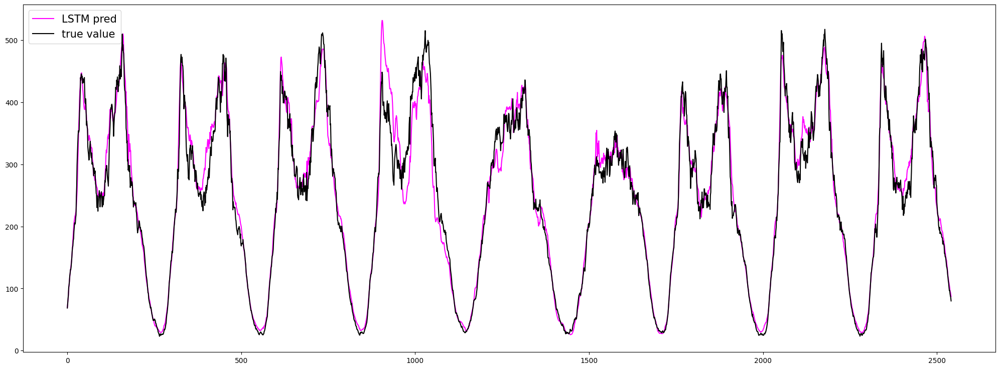

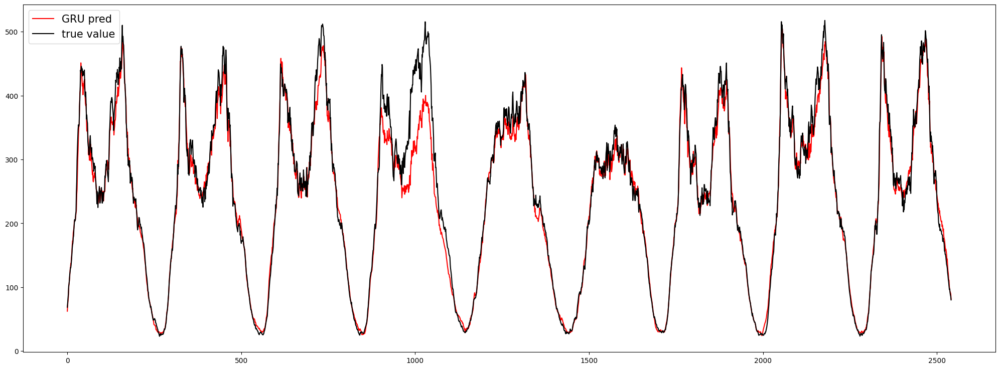

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 28,-,13.700646,20.346099,ERROR,5.782848,5.685367
LSTM Model captor 28,+,15.873220,21.754543,ERROR,6.922629,6.986047
GRU Model captor 28,-,9.879003,13.401586,ERROR,4.556832,4.529294


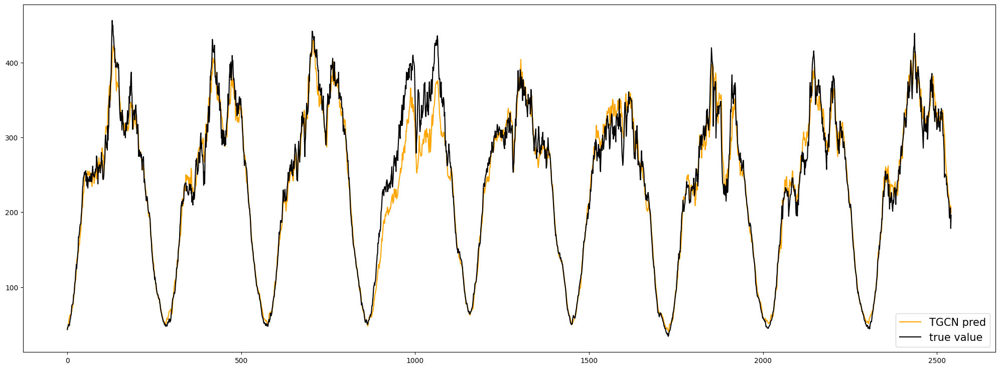

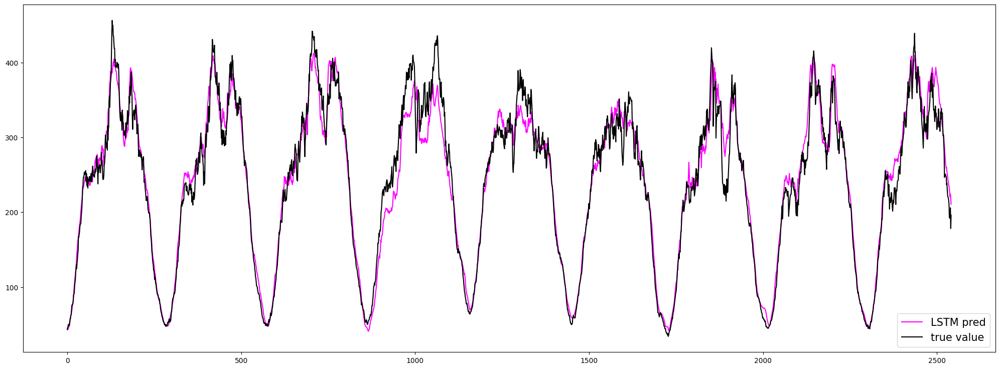

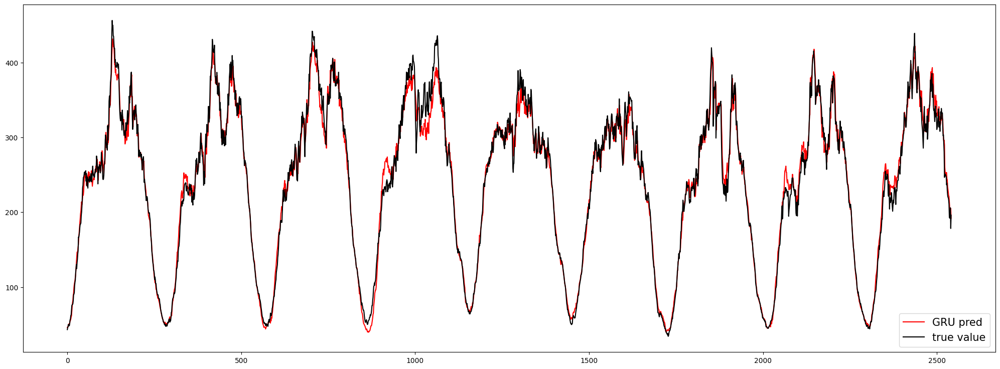

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 170,-,10.686033,14.185264,ERROR,5.594763,5.439816
LSTM Model captor 170,-,12.949207,18.057784,ERROR,6.591759,6.662413
GRU Model captor 170,-,11.095529,16.003541,ERROR,5.739702,5.827057


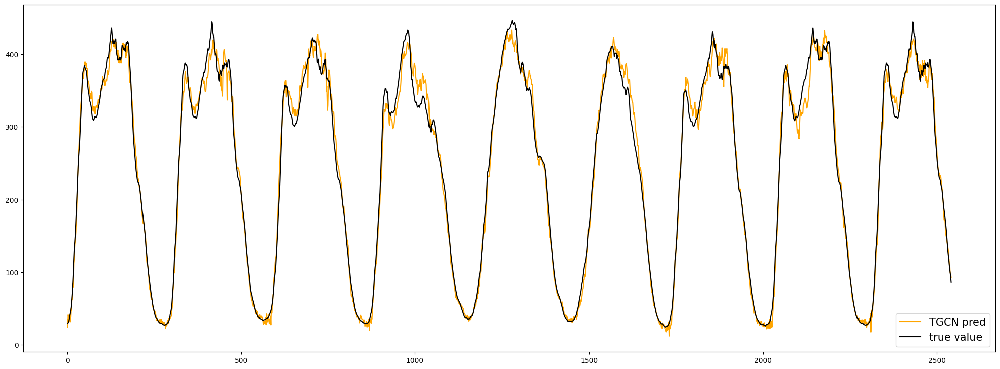

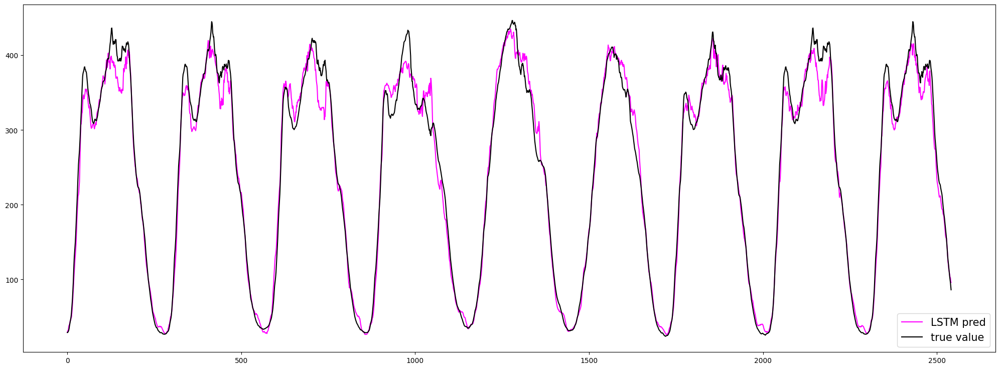

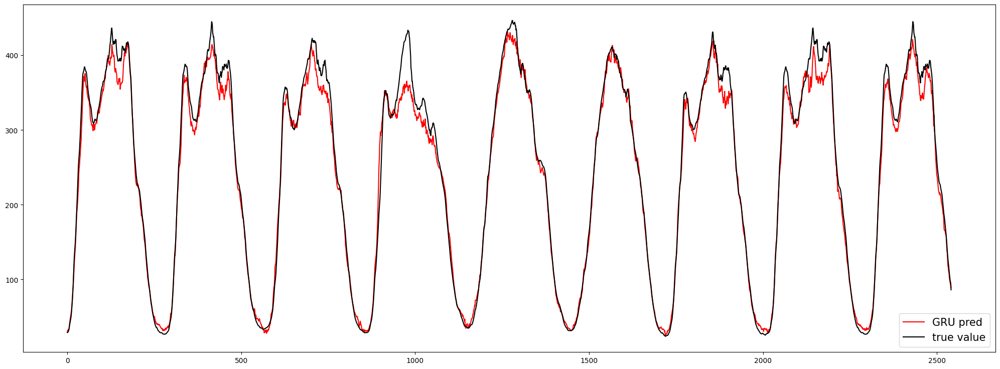

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 0,-,11.548976,15.812170,ERROR,5.009619,4.939644
LSTM Model captor 0,+,14.186164,19.333244,ERROR,6.956818,7.240142
GRU Model captor 0,-,10.602113,14.395320,ERROR,5.189329,5.273942


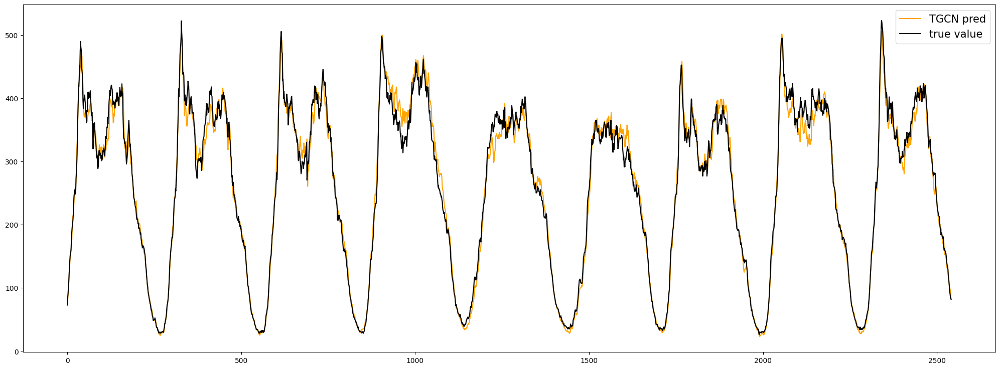

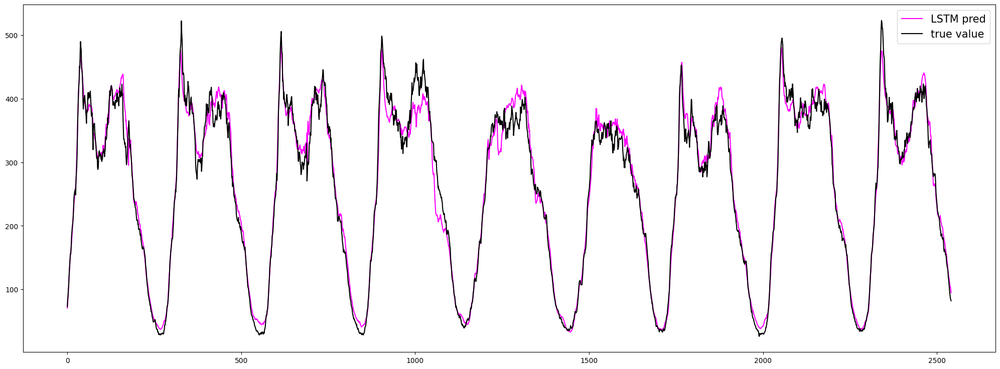

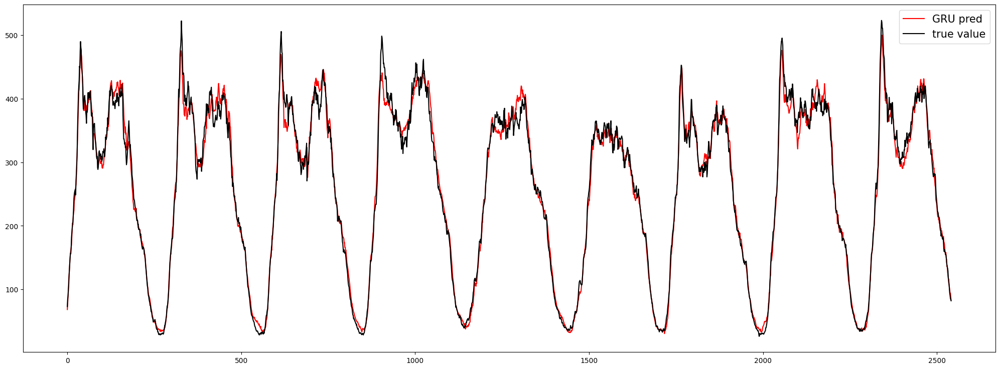

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 18,-,13.063346,16.885604,ERROR,18.687412,13.956333
LSTM Model captor 18,-,25.199683,36.840020,ERROR,24.504302,20.806912
GRU Model captor 18,-,11.877467,18.863388,ERROR,12.176045,11.397293


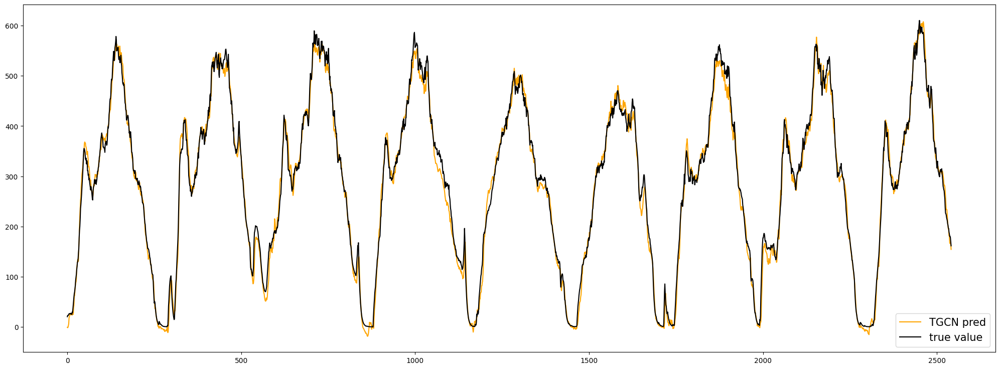

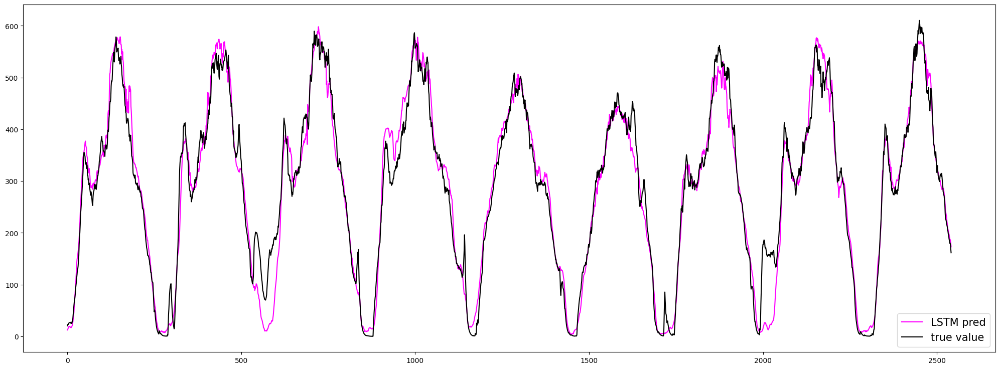

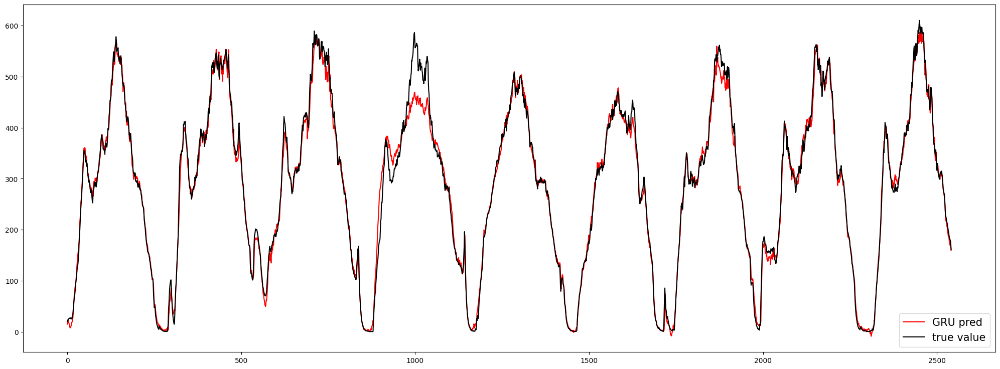

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 127,+,10.715308,14.092510,ERROR,4.629985,4.788938
LSTM Model captor 127,+,16.684409,22.386711,ERROR,7.916371,8.476131
GRU Model captor 127,+,12.757458,16.260280,ERROR,6.528563,6.931454


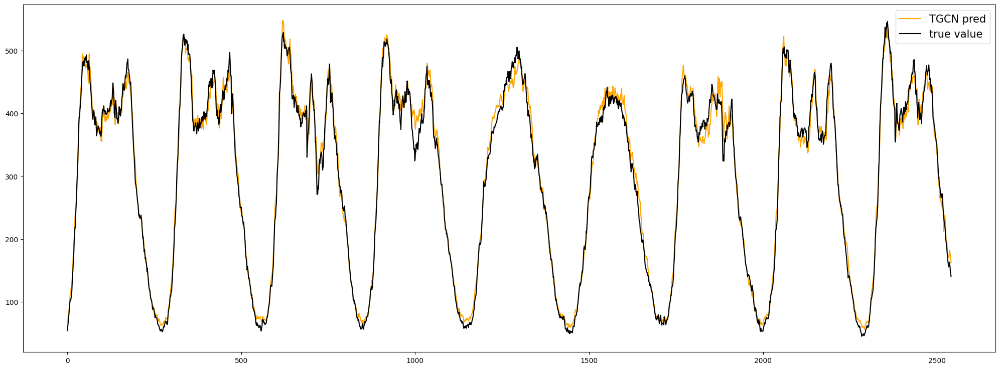

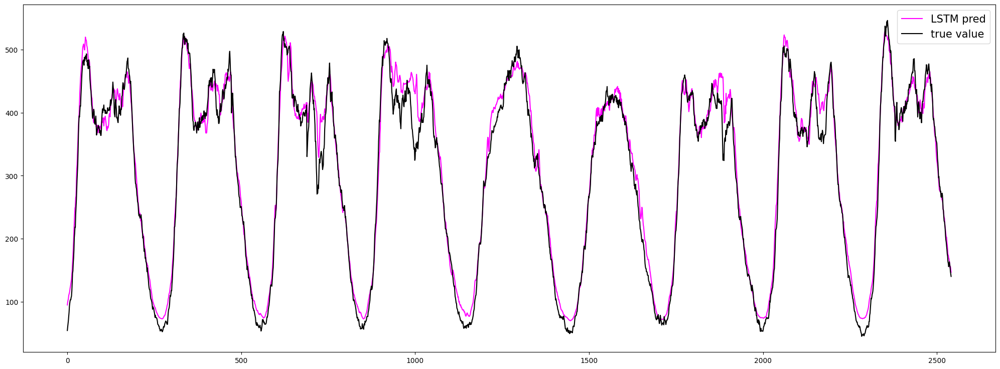

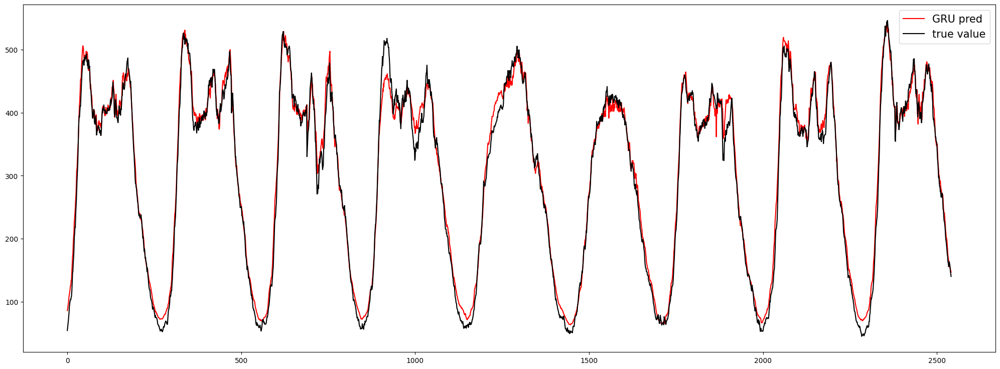

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 173,-,13.349727,18.141096,ERROR,4.403505,4.377593
LSTM Model captor 173,-,16.077582,22.955481,ERROR,5.486081,5.493505
GRU Model captor 173,-,14.351748,21.180274,ERROR,5.361471,5.420861


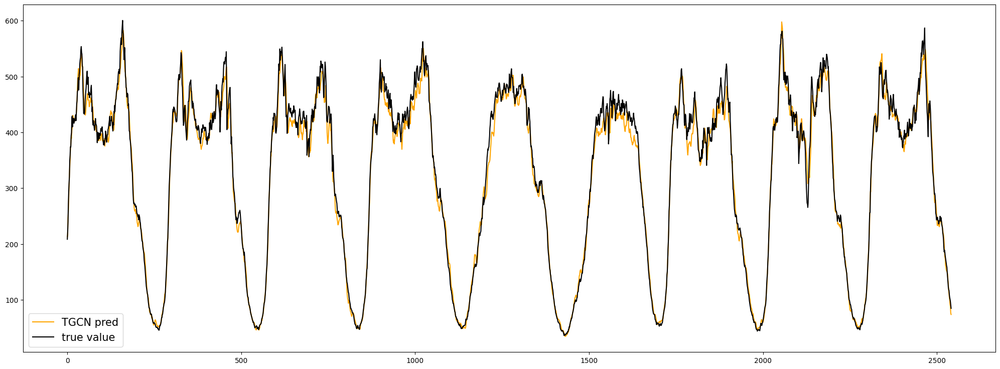

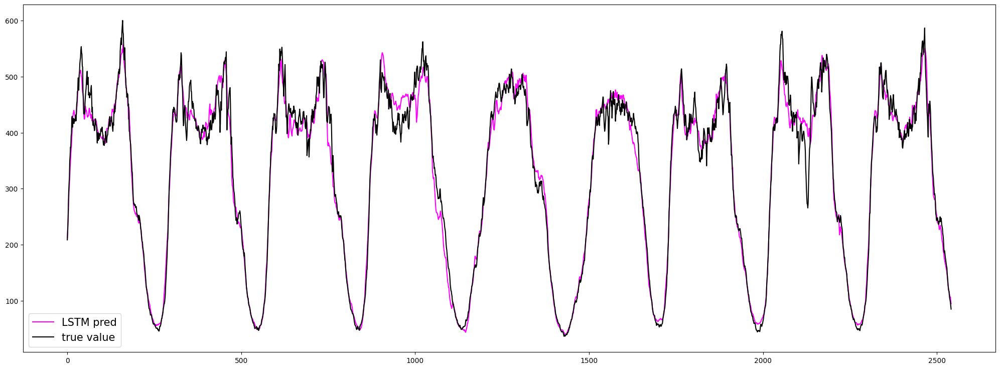

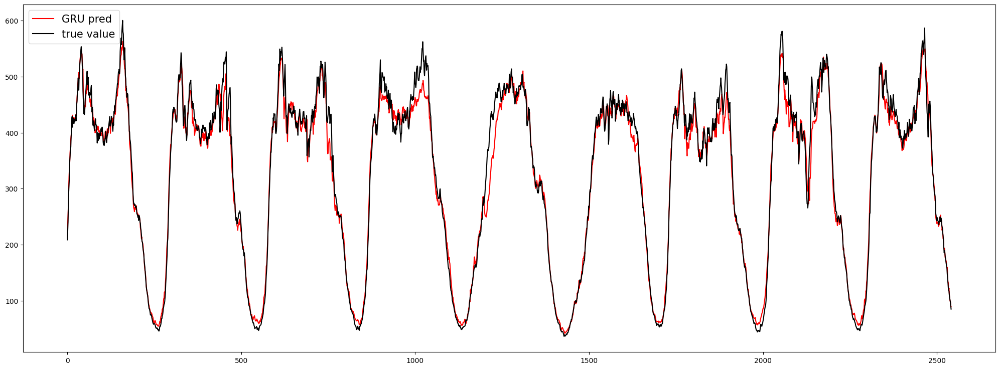

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 271,-,18.224470,28.041018,ERROR,5.977200,5.849105
LSTM Model captor 271,-,20.631809,29.104061,ERROR,6.904010,6.940972
GRU Model captor 271,-,12.764059,17.400526,ERROR,4.260337,4.271151


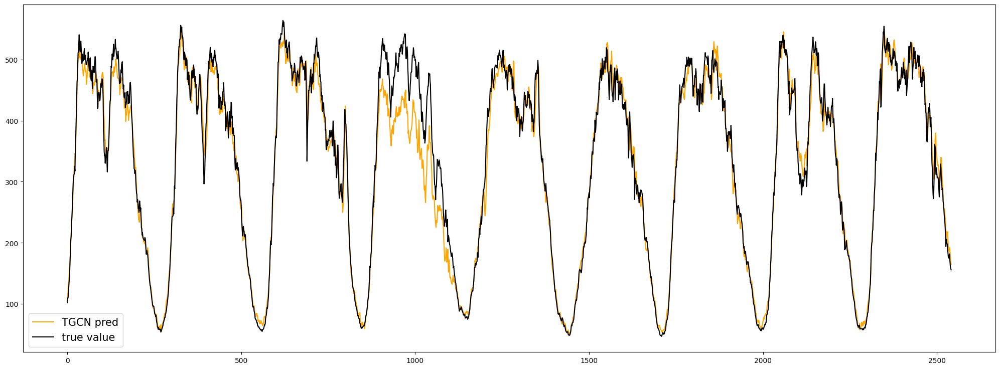

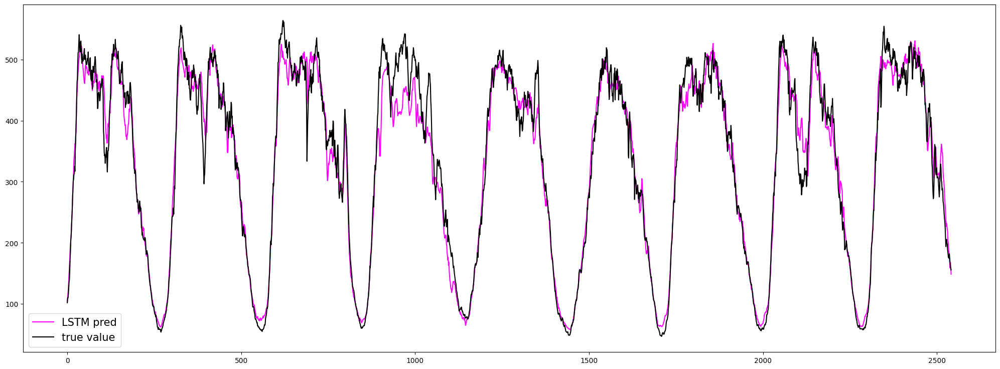

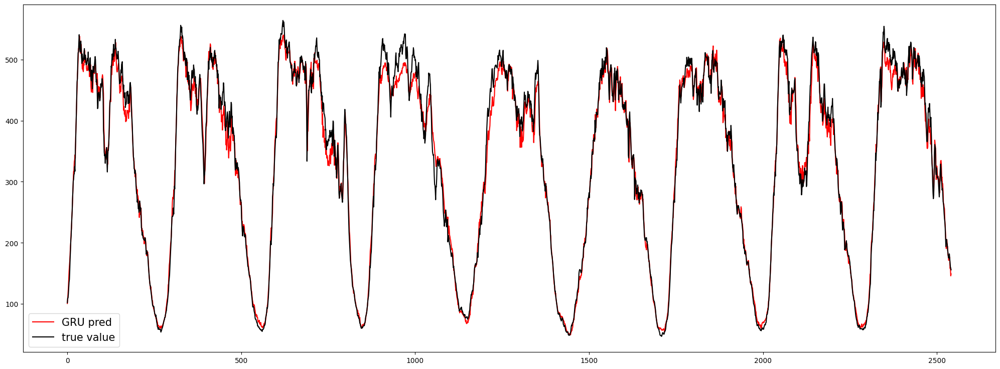

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 92,-,15.173734,20.567471,ERROR,5.413036,5.500143
LSTM Model captor 92,+,24.376813,31.432230,ERROR,12.050686,13.112065
GRU Model captor 92,+,17.822321,22.398968,ERROR,9.520107,10.425985


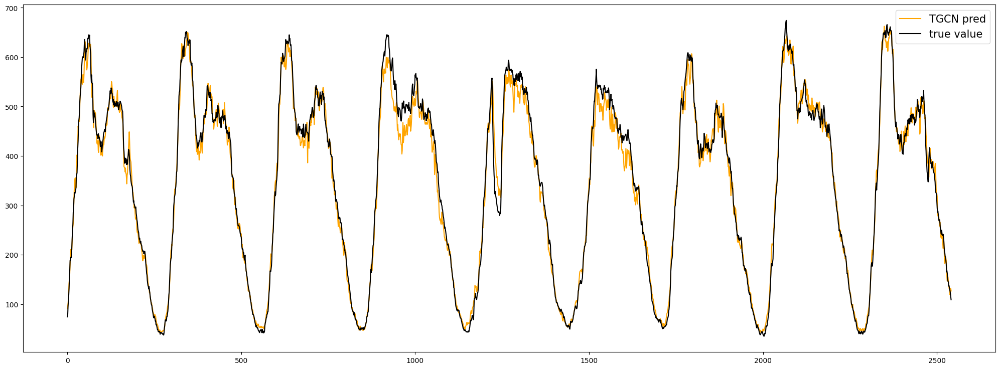

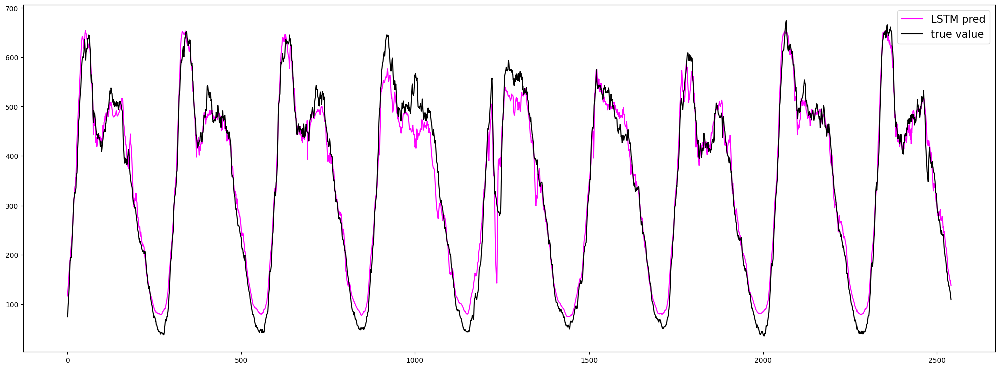

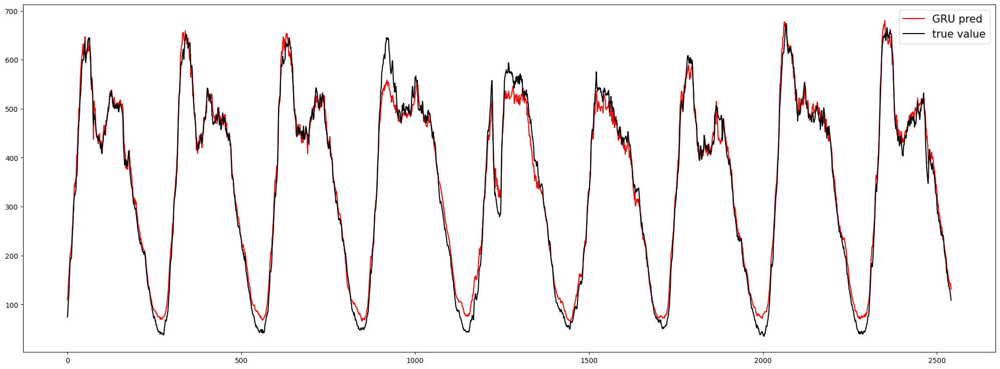

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 57,+,30.006089,50.192304,ERROR,24.422623,20.283405
LSTM Model captor 57,+,58.879713,123.295301,ERROR,26.222691,22.155920
GRU Model captor 57,+,35.382863,70.936203,ERROR,24.635072,20.384161


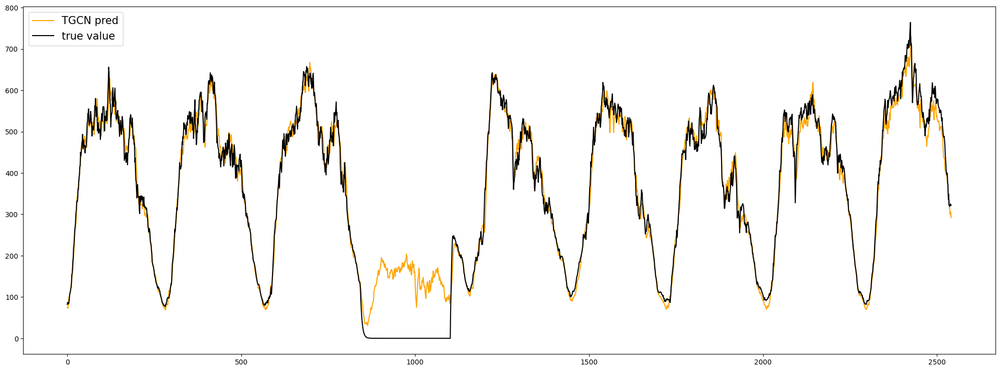

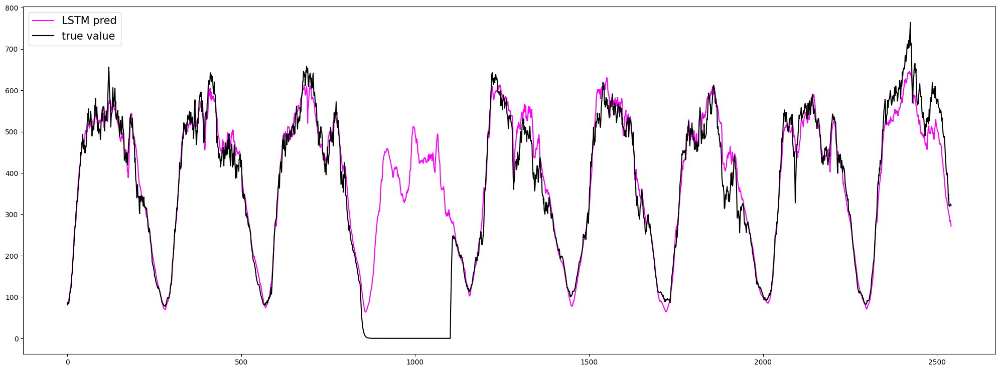

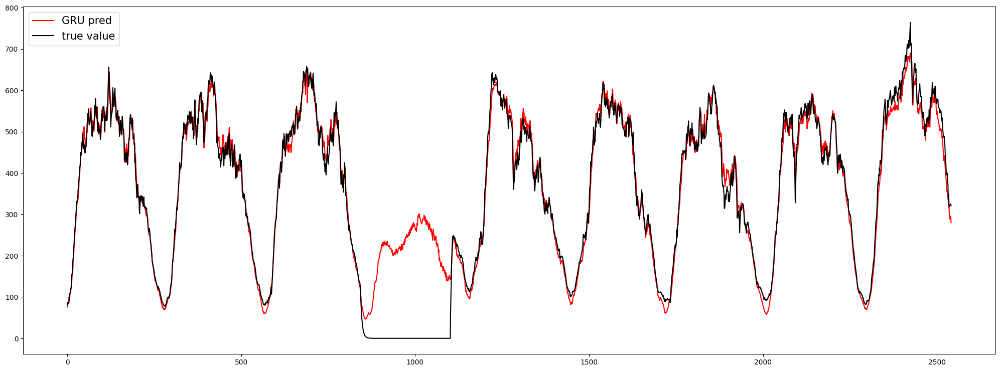

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 146,+,11.090501,15.439135,ERROR,2.886235,2.903669
LSTM Model captor 146,+,19.307113,28.730894,ERROR,4.948901,5.029214
GRU Model captor 146,+,12.988200,19.240996,ERROR,3.364359,3.407272


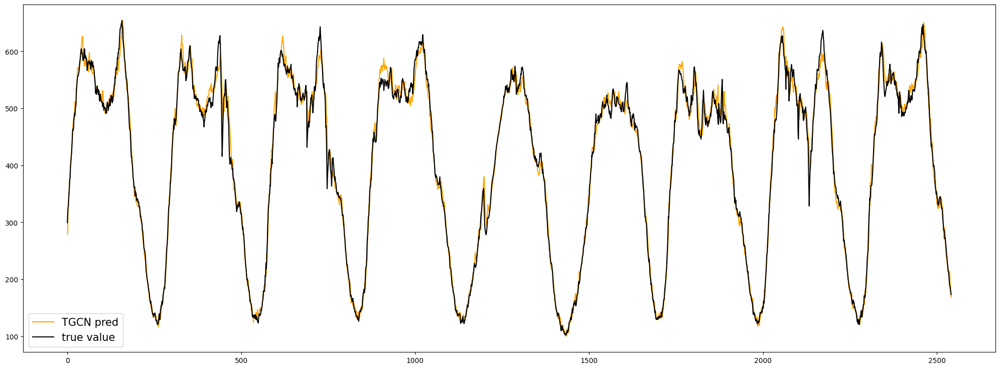

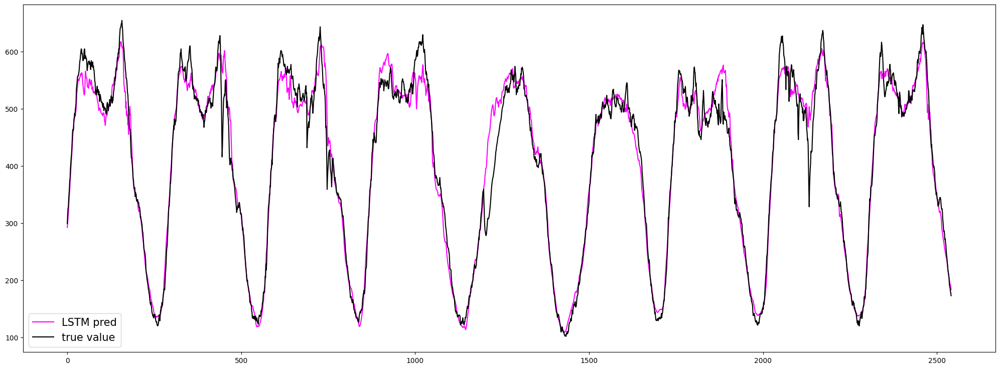

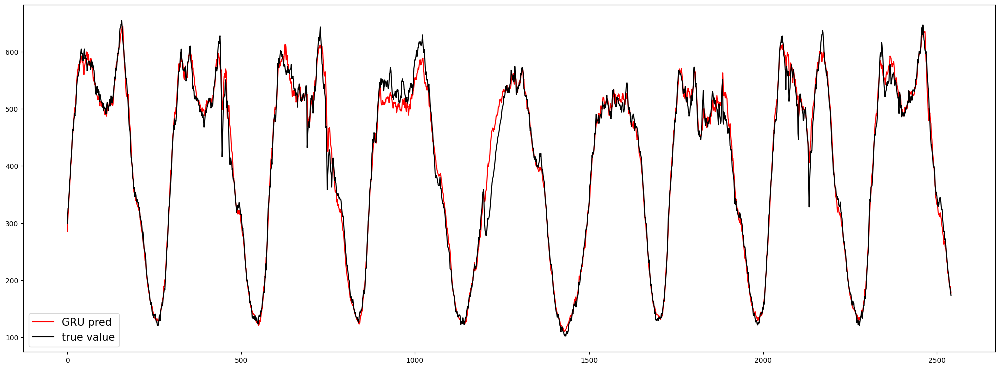

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 97,-,20.951541,29.883373,ERROR,4.702899,4.672177
LSTM Model captor 97,+,25.134560,34.344347,ERROR,6.371054,6.569243
GRU Model captor 97,-,15.057679,20.598966,ERROR,3.866828,3.923231


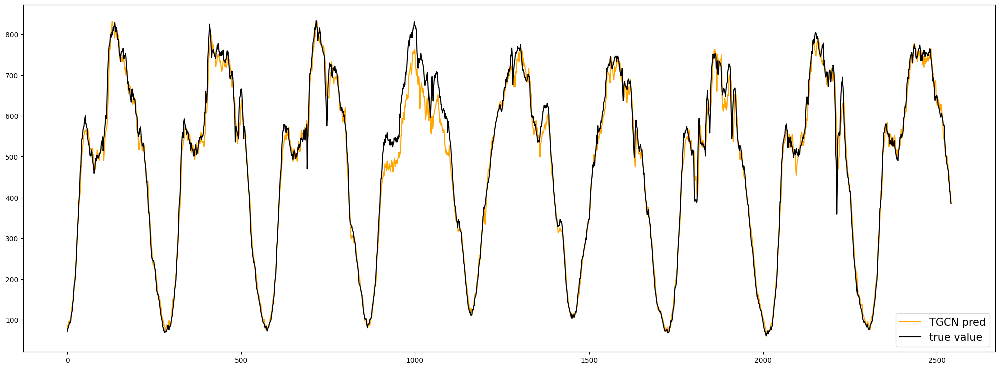

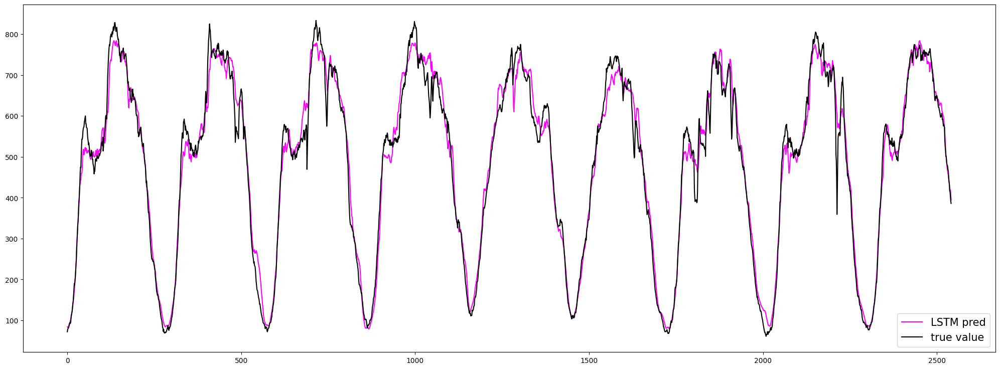

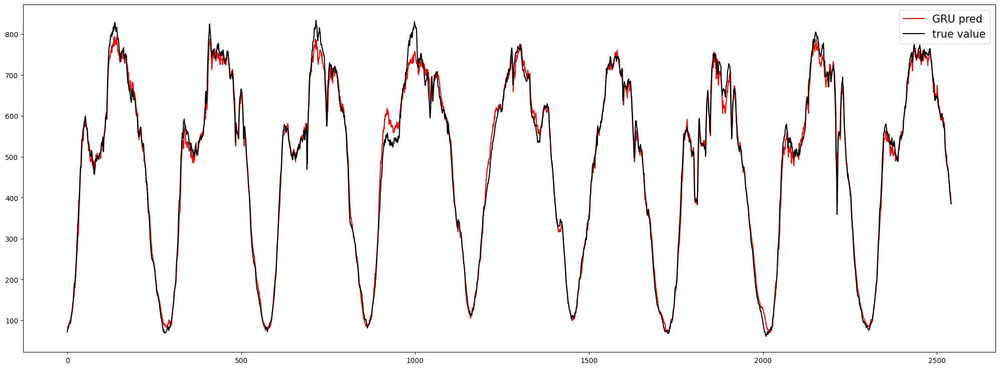

In [20]:
import matplotlib.pyplot as plt

dict_results_multivariate_model = { "TGCN": 0,
                    "LSTM": 0,
                    "GRU": 0
}

######################################################################
# TGCN
######################################################################
# load best model
model_TGCN.load_state_dict(torch.load(f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_TGCN}/TGCN_model.pkl".format(input)))

# Make predictions
predictions_TGCN, actuals_TGCN =  test_model(model_TGCN, test_loader_TGCN)


######################################################################
# LSTM
######################################################################
# load best model
models_multivariate_LSTM["model"].load_state_dict(torch.load(f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_LSTM_multivariate}/multivariate_LSTM_model.pkl".format(input)))
    
# Make predictions
predictions_LSTM, actuals_LSTM = test_model(models_multivariate_LSTM["model"], 
                                models_multivariate_GRU["test_loader"])


######################################################################
# GRU
######################################################################
# Load best model
models_multivariate_GRU["model"].load_state_dict(torch.load(f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_GRU_multivariate}/multivariate_GRU_model.pkl".format(input)))

# Make predictions
predictions_GRU, actuals_GRU = test_model(models_multivariate_GRU["model"], 
                                models_multivariate_GRU["test_loader"])

for i in range(n_neighbors+1):

######################################################################
# TGCN
######################################################################
    # Save result for each captor
    temp = result_prediction(predictions_TGCN[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], 
                            actuals_TGCN[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"])
    temp.append(f"TGCN Model captor {df_PeMS.columns[i]}")
    data = [temp]


######################################################################
# LSTM
######################################################################
    # Save result
    temp = result_prediction(predictions_LSTM[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], 
                            actuals_LSTM[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"])

    temp.append(f"LSTM Model captor {df_PeMS.columns[i]}")
    data.append(temp)


######################################################################
# GRU
######################################################################
    # Save results
    temp = result_prediction(predictions_GRU[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], 
                            actuals_GRU[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"])
    temp.append(f"GRU Model captor {df_PeMS.columns[i]}")
    data.append(temp)


######################################################################
# Dataframe
######################################################################

    df = pd.DataFrame(data, columns=['Signe error', 'MAE', 'RMSE', 'MAPE', 'SMAPE', 'MAAPE', "Captor"])

    # Définir le mois comme index du DataFrame
    df.set_index('Captor', inplace=True)

    pd.set_option('display.max_columns', None)
    pd.set_option('display.max_rows', None)
    pd.set_option('display.width', None)

    min_val = df['MAAPE'].min()
    max_val = df['MAAPE'].max()
    #df = df.style.apply(highlight_col, axis=0, min_val=min_val)
    df = df.style.apply(highlight_rows, axis=1, min_val=min_val, max_val=max_val)
    dict_results_multivariate_model
    display(df)


######################################################################
# Plots
######################################################################

    plt.figure(figsize=(25, 9))
    plt.plot(predictions_TGCN[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="orange", label="TGCN pred")
    plt.plot(actuals_LSTM[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="black", label="true value")
    plt.legend(fontsize=15)
    plt.show()
    
    plt.figure(figsize=(25, 9))
    plt.plot(predictions_LSTM[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="magenta", label="LSTM pred")
    plt.plot(actuals_LSTM[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="black", label="true value")
    plt.legend(fontsize=15)
    plt.show()
    
    plt.figure(figsize=(25, 9))
    plt.plot(predictions_GRU[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="red", label="GRU pred" )
    plt.plot(actuals_LSTM[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="black", label="true value")
    plt.legend(fontsize=15)
    plt.show()
